<a href="https://colab.research.google.com/github/nepslor/teaching/blob/main/CAS_BDML/L1_data_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Time Series visualization and analysis

In this exercise we will go through an example of exploratory analyisis and time series visualization with python. We will usa a dataset containing power measurements and meteorological forecasts relative to a set of **24 power meters** located in Rolle (Switzerland).


<img src="https://raw.githubusercontent.com/nepslor/teaching/main/TimeSeriesForecasting/figs/REeL_Demo_grid.png" width="500"/>

The yellow dots in the image shows the positions of the power meters.
Besides power readings, the dataset includes **temperatue** and **irradiance** measurements from a local meteo station.

Let's start downlowading and looking at the first rows of the dataset:

In [1]:
import pandas as pd
df_all = pd.read_pickle("https://github.com/nepslor/teaching/raw/refs/heads/main/TimeSeriesForecasting/data/power_dataset.pk")
df_all.head()

,meter_0,meter_1,meter_2,meter_3,meter_4,meter_5,meter_6,meter_7,meter_8,meter_9,...,meter_17,meter_18,meter_19,meter_20,meter_21,meter_22,meter_23,temperature,irradiance,power
2018-01-13 00:00:00+00:00,10.924067,19.971333,10.991000,19.610267,22.568533,39.373467,24.236733,10.682333,30.438467,12.038400,...,15.705800,38.678267,28.880200,46.987067,9.210600,15.278733,18.995333,3.619487,0.0,573.045600
2018-01-13 01:00:00+00:00,10.418056,18.249444,8.453500,19.379667,22.487500,36.460167,24.178667,14.893389,32.995056,11.507889,...,15.430444,30.323444,25.714056,36.692833,8.838111,15.119389,18.283167,3.561266,0.0,532.118167
2018-01-13 02:00:00+00:00,10.428778,17.734056,9.990833,19.463278,22.510944,32.887722,22.883222,18.594500,26.831222,12.133444,...,14.510833,18.565000,23.154056,34.869167,9.051500,14.609167,20.989000,3.473098,0.0,512.772444
2018-01-13 03:00:00+00:00,10.892167,17.687778,9.766611,19.478611,23.554167,34.537278,23.711889,17.007222,25.109667,11.699833,...,15.292111,18.035000,22.533889,39.150500,8.748500,14.864056,18.554611,3.339855,0.0,519.231000
2018-01-13 04:00:00+00:00,11.541611,20.967889,11.316667,20.230556,22.401667,36.215833,23.156778,19.735889,26.673556,12.270556,...,16.577556,21.559167,25.279667,29.315611,9.250111,14.716278,15.858500,2.976714,0.0,531.898889


In [2]:
# last timestep in the dataset
print(df_all.index[-1])

# descriptive statistics for the columns in the dataset
df_all.describe()

2019-01-19 23:00:00+00:00


,meter_0,meter_1,meter_2,meter_3,meter_4,meter_5,meter_6,meter_7,meter_8,meter_9,...,meter_17,meter_18,meter_19,meter_20,meter_21,meter_22,meter_23,temperature,irradiance,power
count,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,...,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000
mean,13.240240,22.995100,9.776416,23.408987,42.296906,42.363499,43.060888,15.992326,23.213427,22.036370,...,37.519405,19.556278,26.096104,44.395269,9.500617,16.908534,17.898936,12.119505,158.888095,654.888576
std,3.401995,9.108327,4.124793,10.648852,15.279982,9.175827,22.483835,4.735273,10.224178,7.456191,...,16.142299,8.348750,9.709986,10.448556,2.980065,5.543842,4.734135,8.246418,247.515868,139.533158
min,6.706778,9.435389,-1.621667,6.777222,20.426500,22.024222,15.064111,7.079111,3.121500,9.633000,...,13.255056,4.370111,9.304611,12.718889,4.181444,5.528722,0.000000,-10.242634,0.000000,377.562500
25%,10.643542,16.259292,6.406708,14.299653,30.276014,34.698444,24.934319,12.437653,14.009056,16.428056,...,22.019444,12.683736,19.053250,37.040056,7.414806,12.680611,14.674667,5.114249,0.000000,543.453083
50%,12.604417,21.091528,9.571444,22.436472,39.479056,41.050028,31.576111,15.979583,22.216667,20.602500,...,37.715917,18.232194,24.796556,44.977278,9.183556,16.347083,17.509861,11.720683,13.175627,658.609194
75%,15.382194,28.689097,12.649139,30.167847,53.104556,49.343014,61.689625,18.943194,31.060764,26.366181,...,49.183986,24.419806,32.776333,52.105931,11.349361,20.674250,20.725431,18.725921,226.812266,747.264875
max,25.899500,61.308000,23.763167,65.163278,85.615500,70.580667,105.554389,37.123833,58.556389,62.314278,...,99.361889,50.935111,59.322167,75.778444,22.209611,37.425889,38.202500,32.871330,953.900356,1108.712889


We see that:
* the dataset contains 3 signals, the power and two covariates, irradiance and temperature, possibily useful to predict the power
* The datase has hourly timestamps
* It start Jan 2018 and ends Jan 2019
* Each signals contains 8928 values

## Check for missing values and timestamp regularity
We can check if data presents some missing values:

In [3]:
df_all.isna().sum()

,0
meter_0,0
meter_1,0
meter_2,0
meter_3,0
meter_4,0
meter_5,0
meter_6,0
meter_7,0
meter_8,0
meter_9,0


And the distribution of sampling times:

In [ ]:
df_all.index.diff().value_counts()

,count
0 days 01:00:00,8927


The only present sampling time is 1 hour, this means the series is regularly sampled.

## Line plots
We can try to plot a subset of the dataset as lineplot via pandas:

array([<Axes: >, <Axes: >, <Axes: >], dtype=object)

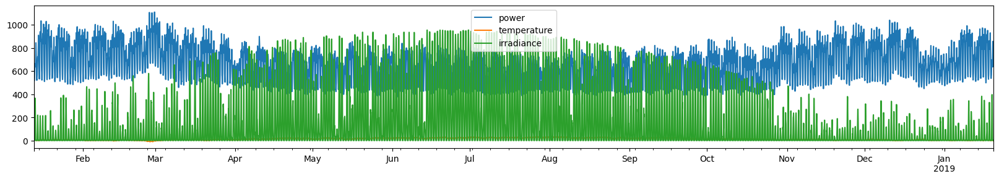

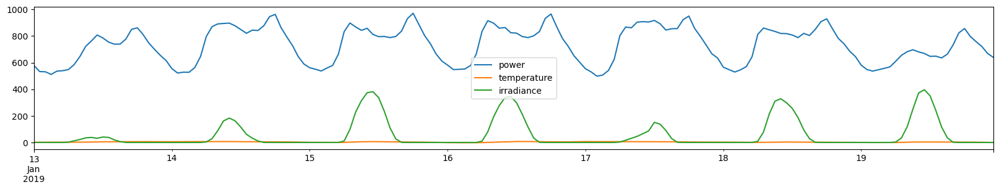

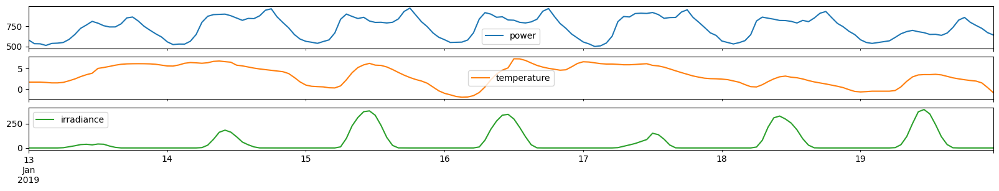

In [4]:
data = df_all[['power', 'temperature', 'irradiance']]

# simple plot
data.plot(figsize=(20, 3))

# last 7 days plot
data.tail(24*7).plot(figsize=(20, 3))

# since signals have different scales, it is useful to plot them in separate axes:
data.tail(24*7).plot(figsize=(20, 3), subplots=True)

Let's plot the power meters' readings, filtering the dataset using the `.filter` method and the `like` argument

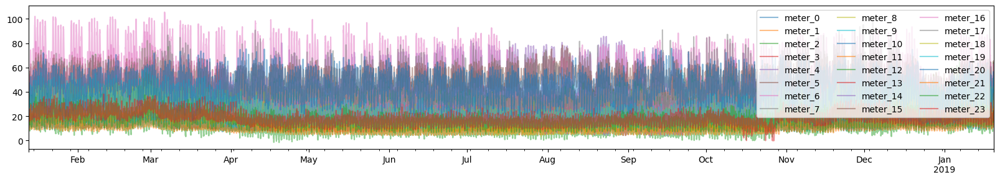

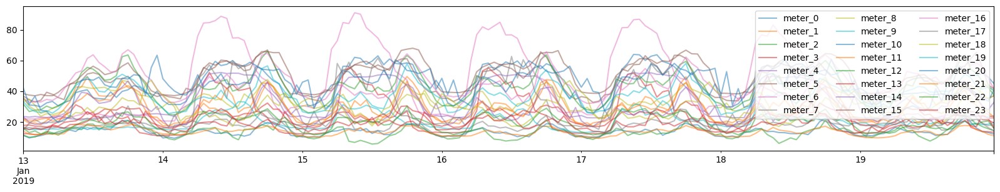

In [ ]:
df_all.filter(like='meter').plot(figsize=(20, 3), alpha=0.5).legend(ncols=3, loc='upper right')
df_all.filter(like='meter').tail(24*7).plot(figsize=(20, 3), alpha=0.5).legend(ncols=3, loc='upper right')

## Scatter plots

We start to do a simple analysis scattering all the signals against each other using the `seaborn` library `pairplot` function. We are also interested in see if the current value of the power is correlated with itself at the previous day. To see this we can use the `panda`'s `shift` method. Note how the first values becom NaNs, since we cannot retrieve past values for the first 24 observations:

In [ ]:
# we shift the signal by 24 steps
data['power'].shift(24)

,power
2018-01-13 00:00:00+00:00,NaN
2018-01-13 01:00:00+00:00,NaN
2018-01-13 02:00:00+00:00,NaN
2018-01-13 03:00:00+00:00,NaN
2018-01-13 04:00:00+00:00,NaN
...,...
2019-01-19 19:00:00+00:00,854.405944
2019-01-19 20:00:00+00:00,782.932556
2019-01-19 21:00:00+00:00,741.659778
2019-01-19 22:00:00+00:00,685.919500


We can use the `.assign` method that temporarly adds a column to the dataframe and scatter all the 4 variables

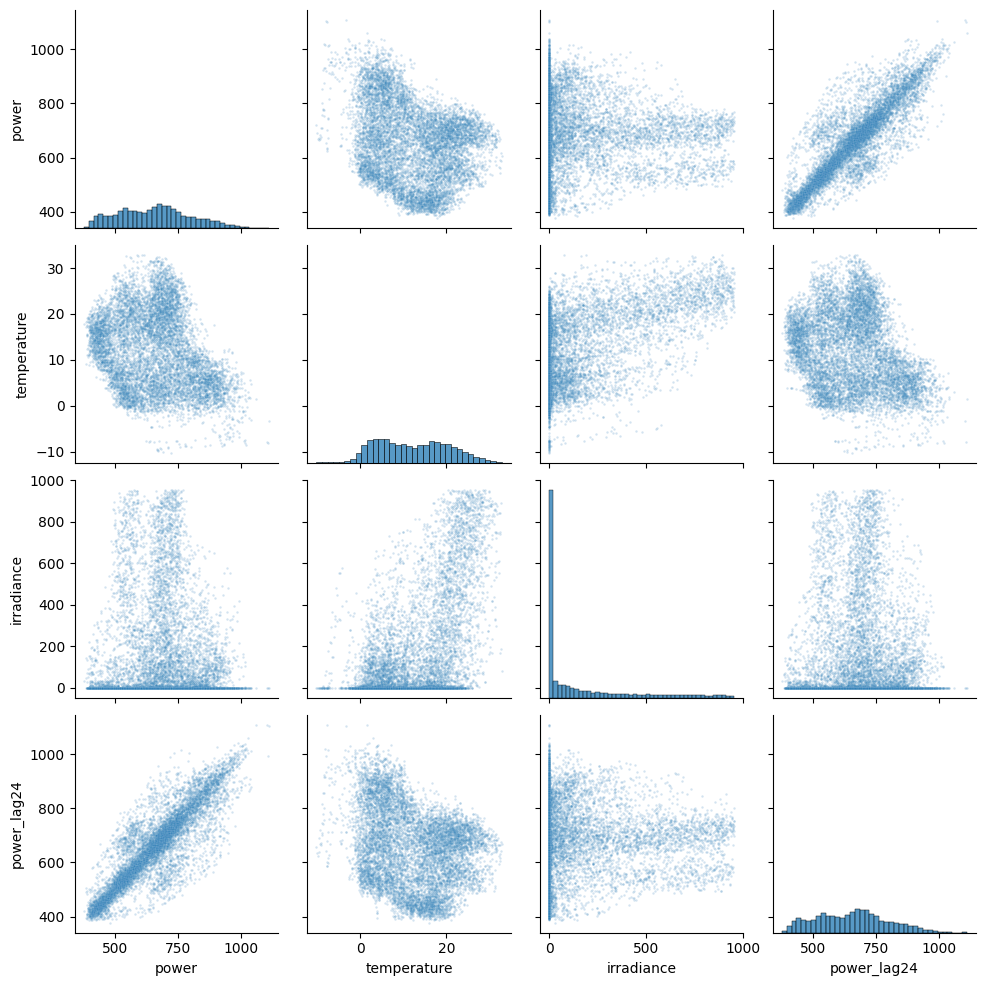

In [ ]:
import seaborn as sb

sb.pairplot(data.assign(power_lag24=data['power'].shift(24)),
            plot_kws={"s": 3, "alpha":0.2})


❓ **which patterns/relations can you spot between these variables?**



We can try to visualize the relationship of the signal with itself at increasing lags by producing a set of scatter polots, here from 1 to 48:  

In [ ]:
#@title Lag Animation
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np

# Create the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Initialize the scatter plot
x = data['power']
y = data['power'].shift(1)
sc = ax.scatter(x, y, s=1, alpha=0.5)

# Set axis labels and title
ax.set_xlabel('Power')
ax.set_ylabel('Power Lag')
ax.set_title('Scatter Plot of Power vs. Power Lag')

# despine axes
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Animation update function
def update(frame):
    k = frame + 1
    sc.set_offsets(list(zip(data['power'], data['power'].shift(k))))  # Update the scatter plot data
    ax.set_ylabel(f'Power Lag {k}')
    # compute correlation
    ax.set_title(f'Scatter Plot of Power vs. Power Lag {k}')
    return sc,

# Create the animation
ani = FuncAnimation(fig, update, frames=48, blit=True, interval=80, repeat=True)
plt.close(fig)
# Display the animation in HTML5
HTML(ani.to_jshtml())


## Auto covariance function
This information can be summarized by plotting just the **linear dependence** of the signal with its previous lags, the autocorrelation function.

$$\begin{align}\rho_k = \frac{cov(x_t, x_{t-k})}{\sigma(x_t)\sigma(x_{t-k})}
\stackrel{stationary}{=}& \frac{cov(x_t, x_{t-k})}{\sigma^2(x)}\\
\stackrel{sampling}{=}& \frac{\sum_{t=1}^{t=T-k} (x_t-\hat{\mu}_x) (x_{t -k}-\hat{\mu}_x)}{T \hat{\sigma}_x}
\end{align}$$
where
$$
\begin{align}
\hat{\mu}_x &= \frac{1}{T} \sum_{t=1}^T x_t \qquad \qquad \ \ \  \color{green}{\text{df.mean()}} \\
\hat{\sigma}_x &= \frac{1}{T} \sum_{t=1}^T (x_t-\hat{\mu}_x)^2 \qquad \color{green}{\text{df.std()}}\\
\end{align}
$$
❓ **Try to code the autocorrelation function using the .shift method**

You can define it as `acf = lambda x, k: your code here`

In [ ]:
acf = lambda x, k: pass # complete this line

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
fig, ax = plt.subplots(figsize=(15, 3))
plot_acf(data['power'], lags=24*8, ax=ax, label='statsmodels ACF');
plt.plot([acf(data['power'], k) for k in range(24*8)], label='our ACF')
plt.grid()
plt.ylim(-0.25, 1)
plt.legend(loc='lower right');

Strong seasonalities can be spotted at 24 hours intervals, with a second local maximum after 7 days (the second dashed vertical line), indicating a strong weekly seasonality.


## Embeddings
We can now try to use the two local maxima (24 and 24*7 steps) as embedding for the time series, and try to see if the signal show eveident patterns.
Loosly speaking the following chain holds:

                        patterns -->  compressibility --> forecastability

The idea: if we reshape the signal with the maxima of the ACF we can plot it as a matrix, making patterns evident.

Text(0.5, 1.0, 'Daily power consumption')

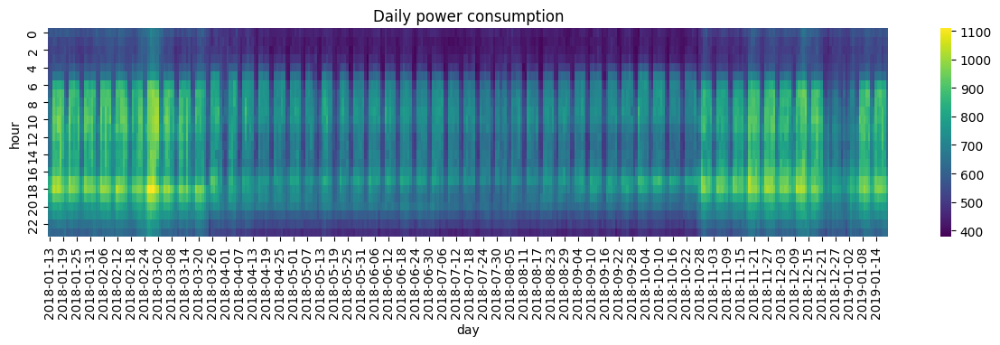

In [ ]:
daily_power = data.assign(                            # assign method temporaly adds new features to a dataframe
    day=data.index.date,
    hour=data.index.hour
).pivot(index='hour', columns='day', values='power')  # pivot create a matrix from "index" and "columns"

# plot heatmap
fig, ax = plt.subplots(figsize=(15, 3))
sb.heatmap(daily_power, cmap='viridis', ax=ax)
ax.set_title('Daily power consumption')


Text(0.5, 1.0, 'Daily power consumption')

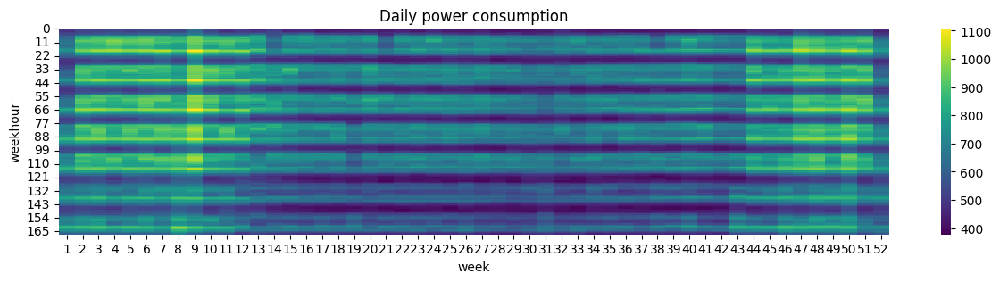

In [ ]:
# the dataset spans more than one year, "week" index is not unique ->
# -> we use pivot_table which average observations falling in the same index-column bin
weekly_power = data.assign(
    week=data.index.isocalendar().week,
    weekhour= data.index.hour + data.index.dayofweek * 24
).pivot_table(index='weekhour', columns='week', values='power')

# plot heatmap
fig, ax = plt.subplots(figsize=(15, 3))
sb.heatmap(weekly_power, cmap='viridis', ax=ax)
ax.set_title('Daily power consumption')


❓ **Try to obtain the same plots for temperature and irradiance. What do you observe?**

<Axes: xlabel='hour'>

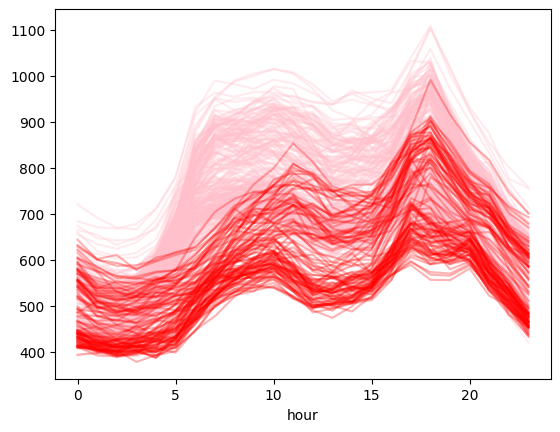

In [ ]:
# get the day of the week of each column
dow = data.assign(day=data.index.date,
      hour=data.index.hour,
      dayofweek=data.index.dayofweek).pivot(index='hour',
                                            columns='day',
                                            values='dayofweek').mean()

daily_power.loc[:,dow<5].plot(color='pink', alpha=0.3, legend=False)
daily_power.loc[:,dow>=5].plot(color='r', alpha=0.3, legend=False, ax=plt.gca())

## ❓Some exploratory analysis
* Among the bottom time series, find the most similar and most dissimilar couples
* Look at the most dissimilar couple. Try to scatter them against the values of the predicted GHI
* Can you spot other series for which the GHI has a similar effect?


# BONUS: forecasting by whithening
In the following we will explore a powerful method to produce probabilistic forecasts of a time series.  

Idea: **if we can make the TS ~white noise through transformations, we can predict it by sampling from the noise and inverting the transform**

Matematically, if
$$f_1(f_2(..f_n(x))) \quad \sim \text{i.i.d.} \quad \mathcal{N}(0, \sigma)$$
then
$$\hat{x}_{t:t+h} = f_n^{-1}(f_{n-1}^{-1}(..f_1^{-1}(\mathcal{N}(0, \sigma))))$$



In [66]:
# let's start by splitting the time series in a training and a test set
p_tr = data['power'].iloc[:-24]
p_te = data['power'].iloc[-24:]


we will apply just two transformations: difference from previous week values and difference from previous step

<Axes: >

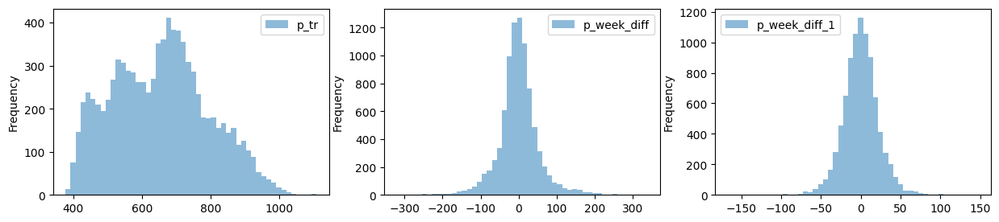

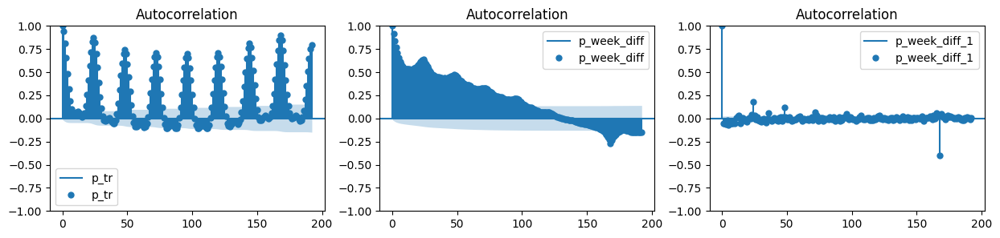

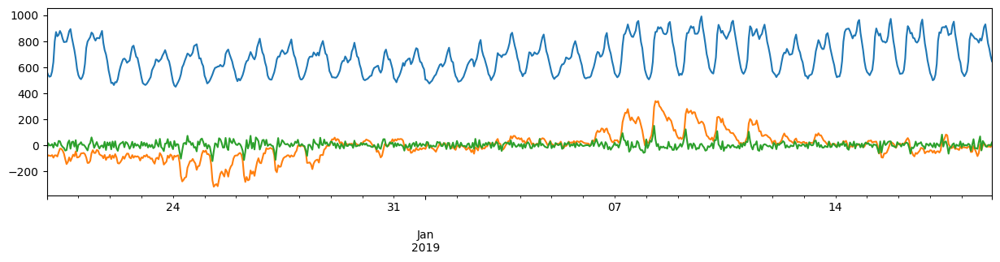

In [85]:
p_week_diff = p_tr.diff(24*7)
p_week_diff_1 = p_week_diff.diff(1)

# plot histograms of p_tr and the other two transfomations
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 3, figsize=(15, 3))
p_tr.plot.hist(ax=axs[0], bins=50, alpha=0.5, label='p_tr')
p_week_diff.plot.hist(ax=axs[1], bins=50, alpha=0.5, label='p_week_diff')
p_week_diff_1.plot.hist(ax=axs[2], bins=50, alpha=0.5, label='p_week_diff_1')
for ax in axs:
    ax.legend()


# plot ACF functions for all the three signals
fig, axs = plt.subplots(1, 3, figsize=(15, 3))
plot_acf(p_tr, lags=24*8, ax=axs[0], label='p_tr')
plot_acf(p_week_diff.dropna(), lags=24*8, ax=axs[1], label='p_week_diff')
plot_acf(p_week_diff_1.dropna(), lags=24*8, ax=axs[2], label='p_week_diff_1')
for ax in axs:
    ax.legend()

plt.figure(figsize=(15, 3))
(p_tr).tail(24*30).plot()
p_week_diff.tail(24*30).plot()
p_week_diff_1.tail(24*30).plot()



<Axes: >

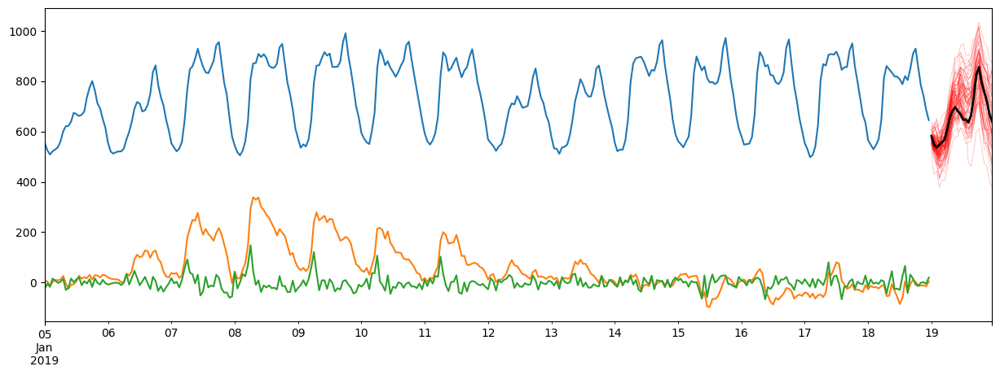

In [109]:
import numpy as np

for i in range(100):
  p_hat =  p_tr.iloc[-24*7:-24*6] + np.random.choice(p_week_diff_1, 24).cumsum()  # values of previous week + integrated samples of p_week_diff_1
  p_hat.index = p_te.index
  p_hat.plot(color='r', alpha=0.3, linewidth=0.5)


# plot the forecast and some hisory
(p_tr).tail(24*14).plot(figsize=(15, 5))
p_week_diff.tail(24*14).plot()
p_week_diff_1.tail(24*14).plot()
p_te.plot(color='k', linewidth=2)
